<a href="https://colab.research.google.com/github/tanvikurade/Rice-Quality-Detection/blob/main/Rice_Quality_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
from tensorflow import keras 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as img
%matplotlib inline
import tensorflow.keras.backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from pylab import imread,subplot,imshow,show
import cv2
import os

In [2]:
train = ImageDataGenerator(rescale=1./255)
test =  ImageDataGenerator(rescale=1./255)

In [3]:
train='/content/drive/MyDrive/Rice/train'

In [4]:
train_data = tf.keras.preprocessing.image_dataset_from_directory(
    train,
    validation_split=0.1,
    image_size=(224,224),
    subset='training',
    seed=1000)

Found 12 files belonging to 3 classes.
Using 11 files for training.


In [5]:
test='/content/drive/MyDrive/Rice/test'

In [6]:
# test_data=tf.keras.preprocessing.image_dataset_from_directory(
#     test,
#     image_size=(224,224)
#     )

In [7]:
class_names = ['Broken', 'Full', 'Mixed']

In [8]:
train_data.class_names = class_names

In [9]:
print(train_data)

<BatchDataset shapes: ((None, 224, 224, 3), (None,)), types: (tf.float32, tf.int32)>


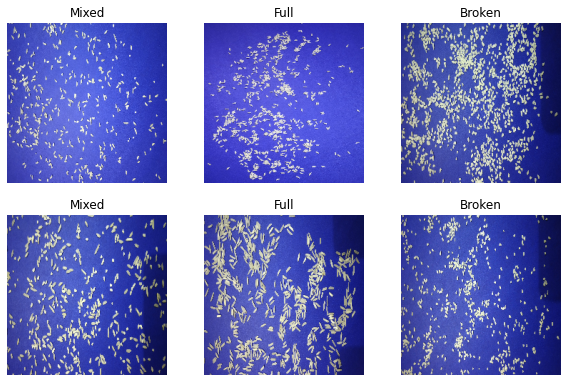

In [10]:
plt.figure(figsize=(10, 10))
for images, labels in train_data.take(1):
    for i in range(6):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(train_data.class_names[labels[i]])
        plt.axis("off")

In [11]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D,Input
from tensorflow.keras.layers import Dense

In [12]:
model=Sequential()

In [13]:
model.add(Conv2D(16,(3,3), activation='relu', input_shape=(224,224,3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(32,(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(32,(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(10,activation='relu'))
model.add(Dense(5,activation='relu'))
model.add(Dense(12,activation='relu'))
model.add(Dense(30,activation='relu'))
model.add(Dense(10,activation='relu'))
model.add(Dense(100,activation='relu'))
model.add(Dense(133,activation='relu'))

In [14]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 32)       0

In [15]:
model.compile(optimizer = tf.keras.optimizers.Adam(1e-4), loss="sparse_categorical_crossentropy", metrics=["accuracy"])

In [16]:
history = model.fit(train_data, epochs=10)

Epoch 1/10
1/1 [==============================] - 2s 2s/step - loss: 8.1058 - accuracy: 0.0909
Epoch 2/10
1/1 [==============================] - 2s 2s/step - loss: 3.7827 - accuracy: 0.0000e+00
Epoch 3/10
1/1 [==============================] - 2s 2s/step - loss: 3.9543 - accuracy: 0.0000e+00
Epoch 4/10
1/1 [==============================] - 2s 2s/step - loss: 3.9748 - accuracy: 0.0000e+00
Epoch 5/10
1/1 [==============================] - 2s 2s/step - loss: 3.9528 - accuracy: 0.0000e+00
Epoch 6/10
1/1 [==============================] - 2s 2s/step - loss: 3.9385 - accuracy: 0.0000e+00
Epoch 7/10
1/1 [==============================] - 2s 2s/step - loss: 3.9225 - accuracy: 0.0000e+00
Epoch 8/10
1/1 [==============================] - 2s 2s/step - loss: 3.9053 - accuracy: 0.0000e+00
Epoch 9/10
1/1 [==============================] - 2s 2s/step - loss: 3.8927 - accuracy: 0.0000e+00
Epoch 10/10
1/1 [==============================] - 2s 2s/step - loss: 3.8805 - accuracy: 0.0000e+00


In [17]:
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
import PIL
from PIL import Image

In [23]:
image_for_testing= '/content/drive/MyDrive/Rice/test/image_4.jpg'

In [24]:
from tensorflow.keras.preprocessing import image
def predict(path):

  image_for_testing=path
  image_show=Image.open(image_for_testing)

  test_image=image.load_img(image_for_testing,target_size=(224,224))
  test_image=image.img_to_array(test_image)
  test_image=test_image/255
  x = image.img_to_array(test_image)
  x = np.expand_dims(x, axis=0)
  p=np.argmax(model.predict(x))
  
  if p==0:
    print('Broken')
  elif p==1: 
    print('Full')  
  else:
    print('Mixed')

  return image_show

Mixed


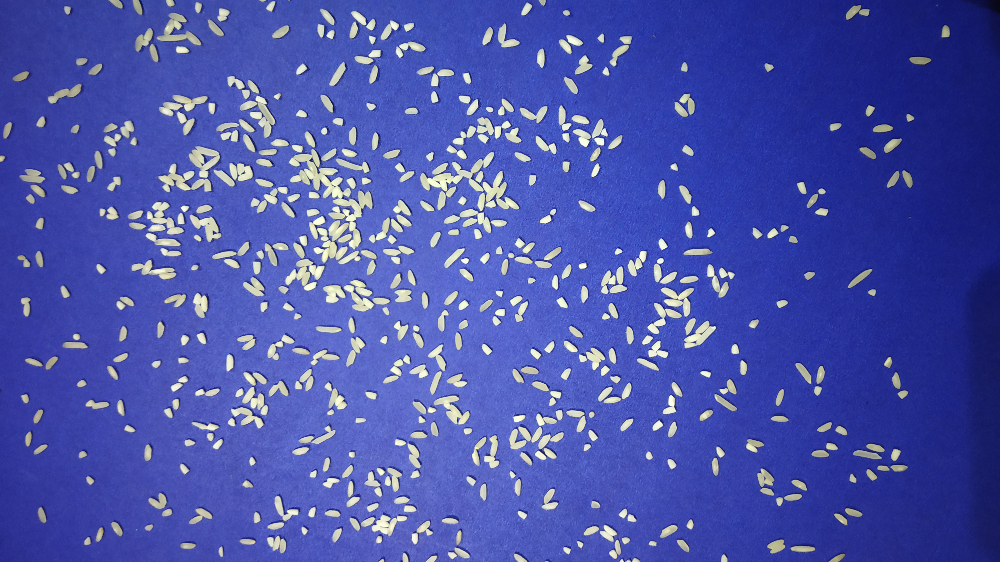

In [25]:
predict('/content/drive/MyDrive/Rice/test/image_4.jpg')